<a href="https://colab.research.google.com/github/totallyguapo/JAVA/blob/main/A01/maxErnst.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:

from google.colab import userdata
from huggingface_hub import login

hf_token = userdata.get('maxRea')  # must match your secret name
login(token=hf_token)


In [6]:
import torch
from diffusers import AutoPipelineForText2Image

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

base_model_id = "Lykon/dreamshaper-8"

pipeline = AutoPipelineForText2Image.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16  # half-precision for faster GPU inference
).to(device)

print("Pipeline loaded successfully!")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Using device: cuda


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/520 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/796 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/614 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/724 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.87k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/756 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


Pipeline loaded successfully!


In [16]:
import torch

from diffusers import AutoPipelineForText2Image

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

base_model_id = "stabilityai/stable-diffusion-xl-base-1.0"

pipeline = AutoPipelineForText2Image.from_pretrained(
    base_model_id,
    torch_dtype=torch.float16  # half-precision for faster GPU inference
).to(device)

print("Pipeline loaded successfully!")


Using device: cuda


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Pipeline loaded successfully!


  0%|          | 0/30 [00:00<?, ?it/s]

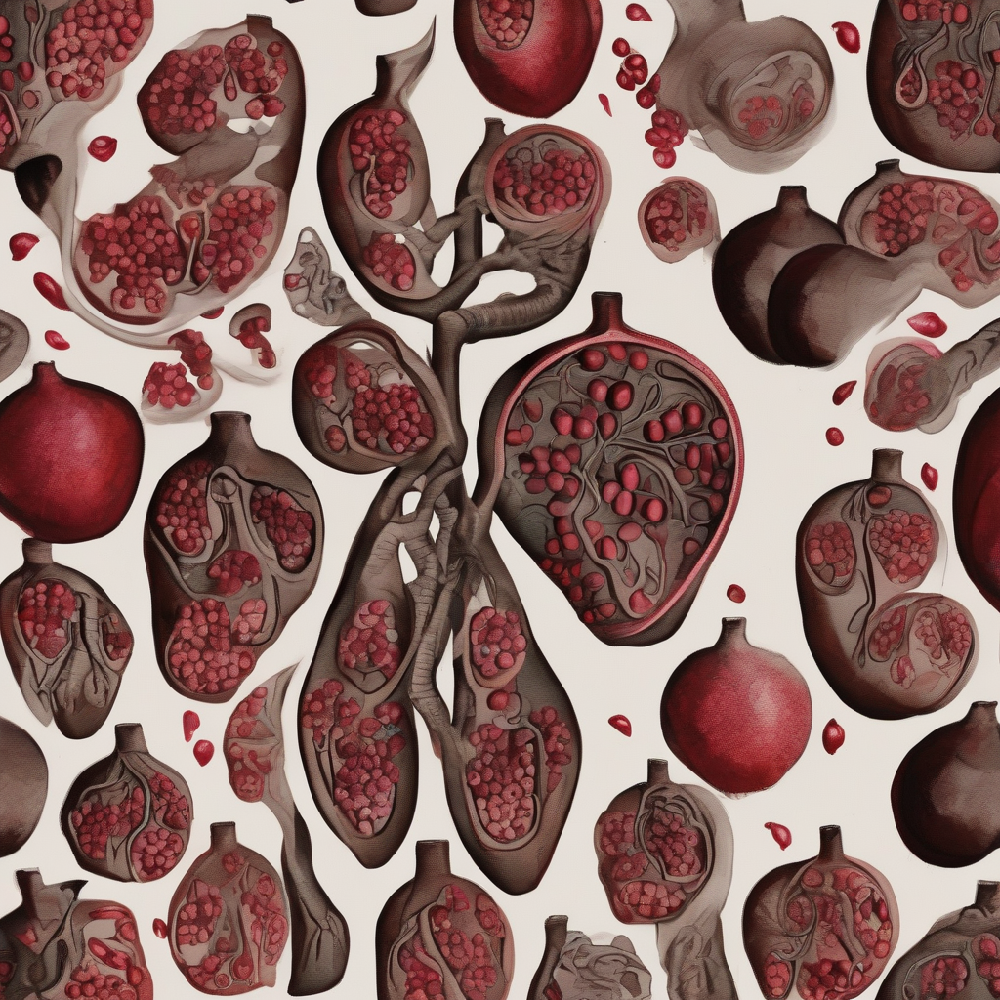

In [2]:

prompt = "a lung made of pomegranates. blacks browns and dark reds."

# 2. Generate an image
result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=7.5,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=30, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("pomLung.png")
image

  0%|          | 0/30 [00:00<?, ?it/s]

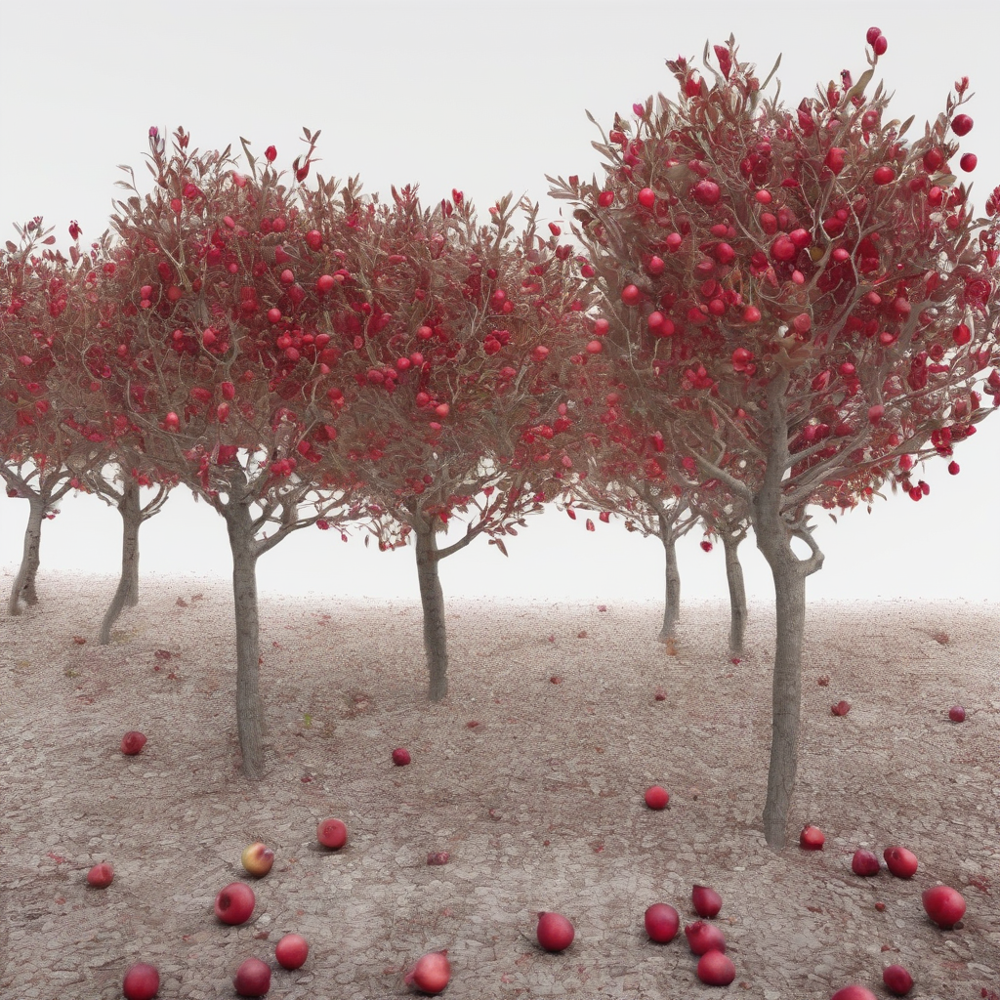

In [17]:

prompt = "trees growing in front of a totally white background. pomegranate red. matte"

# 2. Generate an image
result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=7.5,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=30, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("trees2.png")
image

  0%|          | 0/30 [00:00<?, ?it/s]

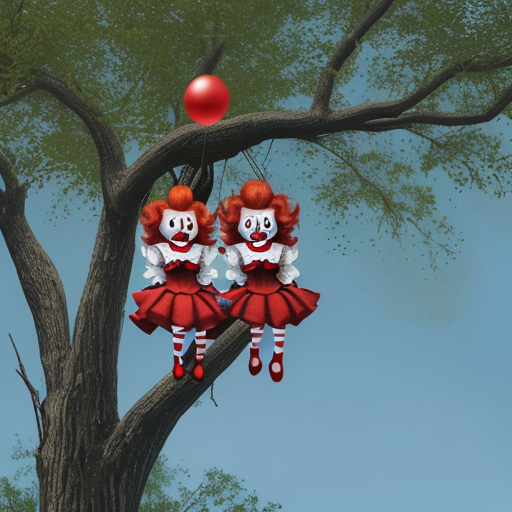

In [7]:

prompt = "many mini red clowns hanging from trees by a noose in the deep south. animated"

# 2. Generate an image
result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=7.5,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=30, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("clowns.png")
image

  0%|          | 0/60 [00:00<?, ?it/s]

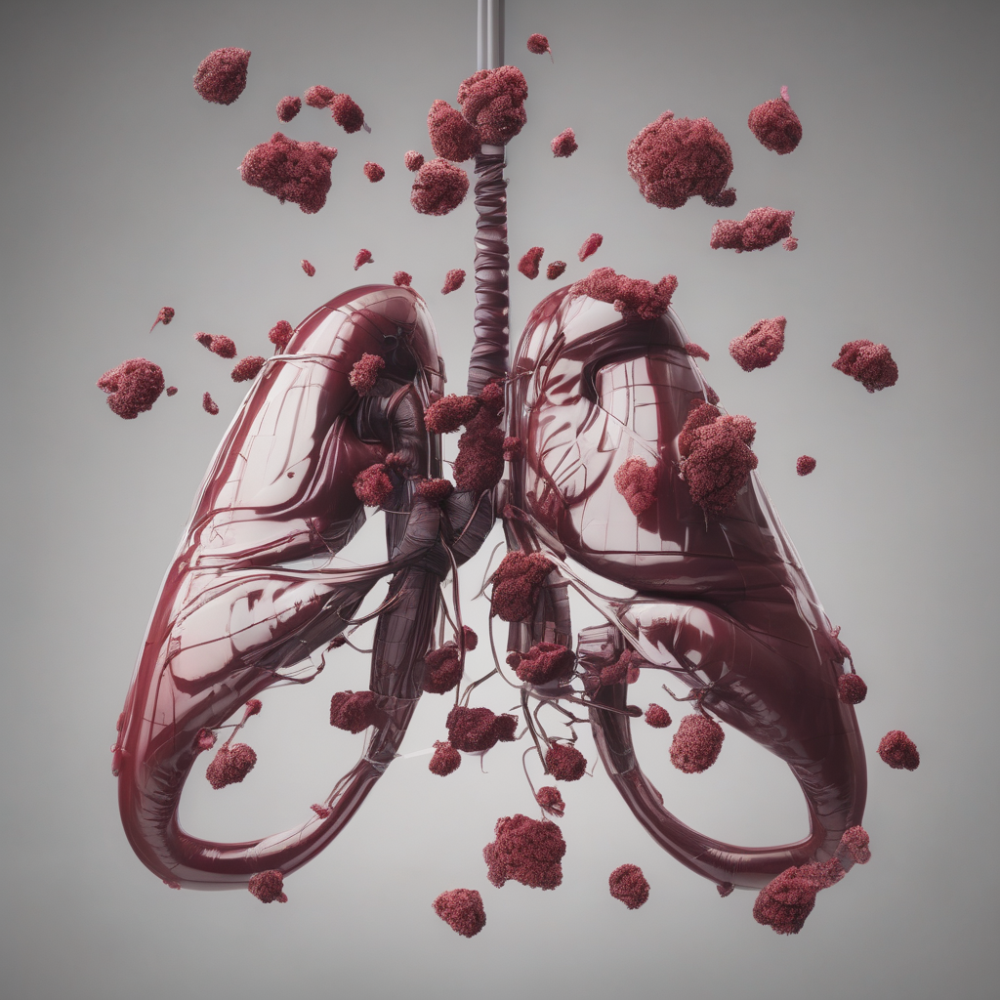

In [23]:

prompt = "several glossy dark red balloons organized in the shape of a pair of human lungs. white background."

result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=2,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=60, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("lungs.png")
image

  0%|          | 0/30 [00:00<?, ?it/s]

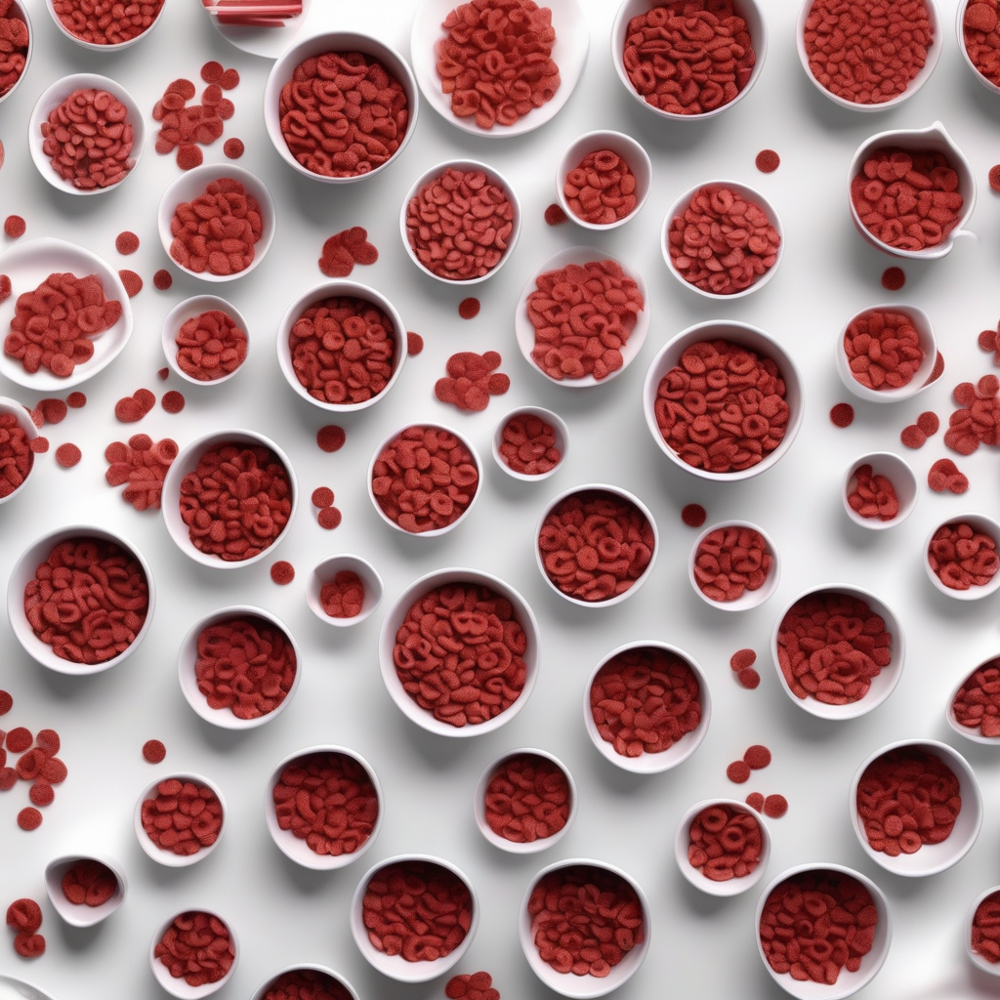

In [19]:

prompt = "bowls of red cereal, each piece of cereal is itself another bowl of cereal. white background. matte. animated"
# 2. Generate an image
result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=7.5,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=30, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("cereal.png")
image

  0%|          | 0/30 [00:00<?, ?it/s]

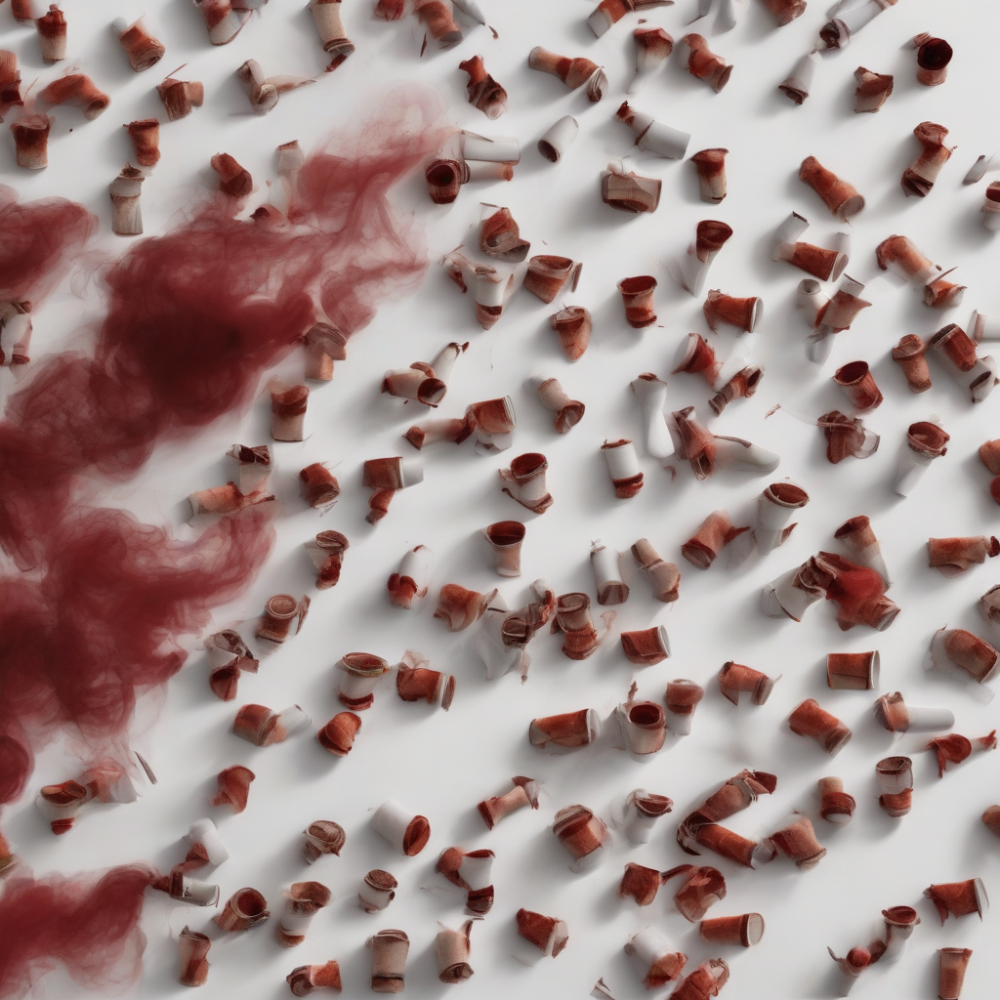

In [24]:

prompt = "red smoke billowing out of smokestacks made of cigarettes.smoke starts thin and expands into the upper frame, filling it. white background"

# 2. Generate an image
result = pipeline(
    prompt=prompt,          # what you want the model to draw
    guidance_scale=2,     # strength of guidance (higher = more closely follows the prompt)
    num_inference_steps=30, # number of denoising steps (quality vs. speed)
    # Optional: adjust resolution (height, width) if supported
    # e.g., height=512, width=512
)

# 3. Access the generated PIL Image(s)
image = result.images[0]

# 4. Display or save the image
image.save("stacks.png")
image